# From here

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))
%load_ext autotime

time: 0 ns (started: 2022-12-13 13:05:46 +09:00)


In [2]:
import numpy as np
import math
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras.models import Model
from tensorflow.keras import layers, losses
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from numpy import savetxt
import pennylane as qml

time: 35.5 s (started: 2022-12-13 13:05:46 +09:00)


To see if the directory path is added to the sys.path, check `sys.path`

In [3]:
# Add directory path of the python-module files to import them.
import sys
# sys.path.insert(0,'/content/drive/MyDrive/qsvdd/QCNN_code_(working)/QCNN-main/Final_QCNN_mod')
sys.path

['C:\\Users\\user1\\Quantum\\qsvdd',
 'C:\\Users\\user1\\anaconda3\\python39.zip',
 'C:\\Users\\user1\\anaconda3\\DLLs',
 'C:\\Users\\user1\\anaconda3\\lib',
 'C:\\Users\\user1\\anaconda3',
 '',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\Pythonwin']

time: 0 ns (started: 2022-12-13 13:06:22 +09:00)


# Data Preparation
- 'MNIST' data is a dataset of 60,000, 28$\times$28 grayscale images of the 10 digits, along with a test set of 10,000 images.
- Each pixel has grey scale value that ranges from 0 to 255.
- More info can be found at the [MNIST homepage](http://yann.lecun.com/exdb/mnist/).
- QCNN : https://github.com/takh04/QCNN/blob/main/README.md


- for "0" image classification
- resize images to 256 to fit with 8 qubits

In [4]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()


time: 328 ms (started: 2022-12-13 13:06:22 +09:00)


In [5]:
x_train.shape

(60000, 28, 28)

time: 0 ns (started: 2022-12-13 13:06:22 +09:00)


In [6]:
x_train, x_test = x_train[..., np.newaxis] / 255.0, x_test[..., np.newaxis] / 255.0  # normalize the data

time: 203 ms (started: 2022-12-13 13:06:22 +09:00)


In [7]:
x_train_filter_0 = np.where(y_train == 4)
x_test_filter_0 = np.where(y_test == 4)

X_train = x_train[x_train_filter_0]
X_test = x_test[x_test_filter_0]
Y_train = y_train[x_train_filter_0]
Y_test = y_test[x_test_filter_0]

time: 16 ms (started: 2022-12-13 13:06:22 +09:00)


In [8]:
X_train.shape

(5842, 28, 28, 1)

time: 0 ns (started: 2022-12-13 13:06:22 +09:00)


In [9]:
X_train = tf.image.resize(X_train[:], (256, 1)).numpy()
X_test = tf.image.resize(X_test[:], (256, 1)).numpy()
X_train, X_test = tf.squeeze(X_train).numpy(), tf.squeeze(X_test).numpy()

time: 94 ms (started: 2022-12-13 13:06:22 +09:00)


In [10]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(5842, 256)
(982, 256)
(5842,)
(982,)
time: 0 ns (started: 2022-12-13 13:06:23 +09:00)


In [11]:
center = qml.numpy.zeros([6], requires_grad=True)
center_train = np.tile(center,(len(X_train),1))
center_train

tensor([[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]], requires_grad=True)

time: 16 ms (started: 2022-12-13 13:06:23 +09:00)


In [12]:
%run ./qcnn_code/Angular_hybrid.py
%run ./qcnn_code/unitary.py
%run ./qcnn_code/embedding.py
%run ./qcnn_code/QCNN_circuit.py
%run ./qcnn_code/Training.py

time: 171 ms (started: 2022-12-13 13:06:23 +09:00)


In [13]:
train_Xdata = X_train
train_Ydata = center_train
conv_filter = 'U_SU4_no_pooling'
# parameter_weights = np.zeros(15)
num_params_conv = 15
data_encoding = 'Amplitude'
circuit_type = 'QCNN'
cost_func = 'svdd'
measure_basis = 'Z'

loss_history, est_params, param_history = circuit_training(X_train=train_Xdata,
                                            Y_train=train_Ydata,
                                            U=conv_filter,
                                            U_params=num_params_conv,
                                            embedding_type=data_encoding,
                                            circuit=circuit_type,
                                            cost_fn=cost_func,
                                            measure_axis=measure_basis)

C:\Users\user1\anaconda3\lib\site-packages\autograd\numpy\numpy_vjps.py:698: ComplexWarning: Casting complex values to real discards the imaginary part
  onp.add.at(A, idx, x)


iteration:  0  cost:  0.04963260691646887
iteration:  5  cost:  0.03914397984854001
iteration:  10  cost:  0.041739030683328966
iteration:  15  cost:  0.023164357531116946
iteration:  20  cost:  0.023107639954681816
iteration:  25  cost:  0.028472199888140565
iteration:  30  cost:  0.028682190798038548
iteration:  35  cost:  0.019783112191023775
iteration:  40  cost:  0.019911862848918434
iteration:  45  cost:  0.02708506606141396
iteration:  50  cost:  0.01740010347314448
iteration:  55  cost:  0.016057199686399473
iteration:  60  cost:  0.017225126229716576
iteration:  65  cost:  0.012912899936115017
iteration:  70  cost:  0.020198087308910043
iteration:  75  cost:  0.01653393950738455
iteration:  80  cost:  0.018352783895066963
iteration:  85  cost:  0.014971318086232106
iteration:  90  cost:  0.014260218175419403
iteration:  95  cost:  0.017045511513080258
iteration:  100  cost:  0.016630325615505766
iteration:  105  cost:  0.016015517094828298
iteration:  110  cost:  0.01169025386

In [14]:
# from pennylane import numpy as np
# est_params = np.random.randn(45, requires_grad = True)
est_params

tensor([ 0.46528098, -0.2232543 ,  0.44227214,  1.32828151, -0.38789705,
         0.76411053, -0.93796416,  0.61323414,  0.11874924, -0.0620997 ,
         1.40961982, -1.71778781, -0.22243817,  0.53975461, -1.63821896,
        -0.04623958,  0.44836965, -0.12619526, -1.78561531,  0.84590613,
        -0.12518168, -0.12325522,  0.68171589,  1.66761688,  0.22808467,
        -1.34200464,  0.58528899, -0.5486006 , -0.6708256 , -0.09994483,
        -0.53102991,  1.14570906,  0.41606298,  0.10515875,  0.14149935,
         0.36884383, -0.31645946, -1.3956617 , -0.35172521,  0.8196653 ,
        -0.50258805,  0.52979863,  0.32041312, -2.42115012,  0.04769666,
        -1.47310372, -0.1584908 ,  0.56828058, -0.33660895,  0.30435245,
         0.08577399,  1.14419789,  1.86590205, -0.11882303,  1.4732605 ,
        -2.22226686, -0.64326644, -0.82080039,  0.34640506,  0.07898231,
         1.09341988, -0.23500253, -0.37483438,  1.27149652,  0.15424749,
        -1.94265152,  0.83886427,  1.79234689,  0.3

time: 0 ns (started: 2022-12-14 02:37:01 +09:00)


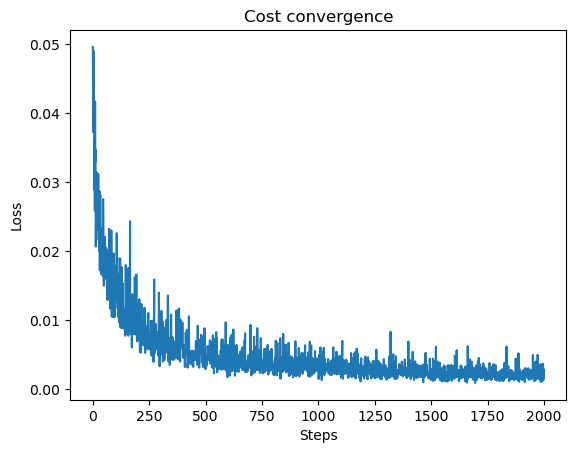

time: 500 ms (started: 2022-12-14 02:37:01 +09:00)


In [15]:
plt.plot(loss_history)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Cost convergence")

plt.savefig('./img/OCC4/qsvdd/cost_qsvdd.png')

In [16]:
savetxt('./img/OCC4/qsvdd/param_list_qsvdd',est_params.numpy(),delimiter=',')

time: 0 ns (started: 2022-12-14 02:37:02 +09:00)


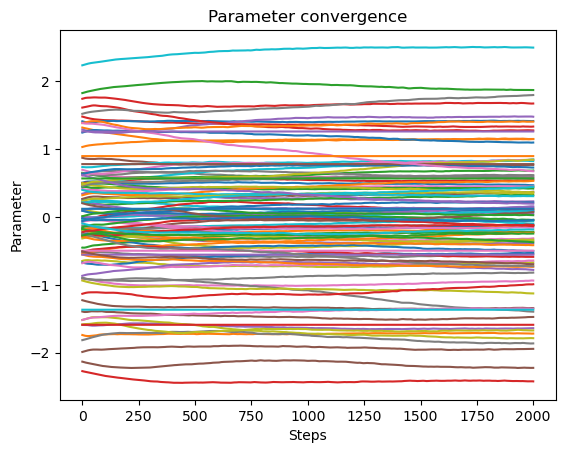

time: 500 ms (started: 2022-12-14 02:37:02 +09:00)


In [17]:
plt.plot(param_history)
plt.xlabel("Steps")
plt.ylabel("Parameter")
plt.title("Parameter convergence")
plt.savefig('./img/OCC4/qsvdd/parameters_qsvdd.png')

### train result

In [18]:
# Implement trained circuit for MNIST "1" train data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_train])

time: 57min 3s (started: 2022-12-14 02:37:02 +09:00)


In [19]:
predictions_exp0

tensor([[-0.00665041, -0.01850385, -0.00436503,  0.00135691,  0.01635466,
         -0.00158041],
        [ 0.02474272, -0.01293155, -0.01678785, -0.00212822, -0.00924894,
          0.00392735],
        [ 0.00582327,  0.01999072, -0.0101634 , -0.0086848 , -0.01416482,
          0.0120351 ],
        ...,
        [-0.00803849,  0.01619692,  0.00298015, -0.01879136, -0.0184914 ,
         -0.01670151],
        [ 0.0244919 ,  0.01916289, -0.03546995,  0.00182231, -0.01187112,
          0.00794519],
        [-0.01062139,  0.00560267,  0.01005185, -0.00767733,  0.01622793,
         -0.0137301 ]], requires_grad=True)

time: 0 ns (started: 2022-12-14 03:34:06 +09:00)


In [20]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]

time: 8.64 s (started: 2022-12-14 03:34:06 +09:00)


In [21]:
# center = center.detach().numpy()

time: 0 ns (started: 2022-12-14 03:34:15 +09:00)


In [22]:
# center[0]

time: 0 ns (started: 2022-12-14 03:34:15 +09:00)


In [23]:
predictions_exp = 0

time: 0 ns (started: 2022-12-14 03:34:15 +09:00)


In [24]:
import plotly.express as px
import plotly.graph_objects as go


df = predictions_exp
label_value_string = np.array(Y_train).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0[:,0], 
                          y = predictions_exp0[:,1], 
                          z = predictions_exp0[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)


fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)

fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()
fig_ploty.write_html('./img/OCC4/qsvdd/train.html')
# fig_test_ploty.write_html('Result/ploty_figure_test.html')

time: 11.3 s (started: 2022-12-14 03:34:15 +09:00)


In [25]:
# L1-norm of trained MNIST "0" train data
abs(predictions_exp0 - center).mean(axis=1).mean()

tensor(0.01335526, requires_grad=True)

time: 0 ns (started: 2022-12-14 03:34:26 +09:00)


In [26]:
score_train = abs(predictions_exp0 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:34:26 +09:00)


In [27]:
score_var_train = abs(predictions_exp0 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 03:34:26 +09:00)


### score for test data

In [28]:
# Implement trained circuit for MNIST "0" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0_test = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_test])

time: 9min 20s (started: 2022-12-14 03:34:26 +09:00)


In [29]:
print(predictions_exp0_test)
print(predictions_exp0_test.shape)

[[-3.16270809e-02  1.53733649e-02  2.06616926e-02 -2.36970605e-02
   6.29888563e-03 -1.85117128e-03]
 [-3.53750342e-02  3.29530531e-02 -1.13420775e-02  4.93694500e-03
  -1.67135294e-02 -8.82713351e-03]
 [-6.48130299e-03 -2.03333522e-02 -6.61038116e-03  2.72257248e-03
   1.64288266e-02 -3.42997953e-03]
 ...
 [ 9.54257730e-03 -3.73308139e-03 -1.76243645e-02  1.44734786e-06
  -1.08965174e-02  4.67923088e-04]
 [-1.74595920e-03  1.42014479e-02 -5.03780850e-03  2.71770728e-03
   6.13082555e-03 -8.99805566e-03]
 [ 1.20105980e-02 -7.28208297e-04  1.91255278e-02  1.18182181e-02
   8.07441221e-03 -5.05155487e-03]]
(982, 6)
time: 15 ms (started: 2022-12-14 03:43:47 +09:00)


In [30]:
score_test0 = abs(predictions_exp0_test - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:43:47 +09:00)


In [31]:
score_var_test0 = abs(predictions_exp0_test - center).mean(axis=1)


time: 0 ns (started: 2022-12-14 03:43:47 +09:00)


In [32]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 03:43:47 +09:00)


In [33]:
import plotly.express as px
import plotly.graph_objects as go


df = predictions_exp
label_value_string = np.array(Y_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0_test[:,0], 
                          y = predictions_exp0_test[:,1], 
                          z = predictions_exp0_test[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)
# fig_ploty.show()

fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test.html')

time: 219 ms (started: 2022-12-14 03:43:47 +09:00)


### score for test0

In [34]:
x_train_filter_1 = np.where(y_train == 0)
x_test_filter_1 = np.where(y_test == 0)

X1_train = x_train[x_train_filter_1]
X1_test = x_test[x_test_filter_1]
Y1_train = y_train[x_train_filter_1]
Y1_test = y_test[x_test_filter_1]

time: 62 ms (started: 2022-12-14 03:43:47 +09:00)


In [35]:
X1_train.shape

(5923, 28, 28, 1)

time: 16 ms (started: 2022-12-14 03:43:47 +09:00)


In [36]:
X1_train = tf.image.resize(X1_train[:], (256, 1)).numpy()
X1_test = tf.image.resize(X1_test[:], (256, 1)).numpy()
X1_train, X1_test = tf.squeeze(X1_train).numpy(), tf.squeeze(X1_test).numpy()

time: 16 ms (started: 2022-12-14 03:43:47 +09:00)


In [37]:
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)

(5923, 256)
(980, 256)
(5923,)
(980,)
time: 0 ns (started: 2022-12-14 03:43:47 +09:00)


In [38]:
# Implement trained circuit for MNIST "1" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp1 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X1_test])

time: 9min 35s (started: 2022-12-14 03:43:47 +09:00)


In [39]:
print(predictions_exp1)
print(predictions_exp1.shape)

[[-0.00105652  0.02309619 -0.02510036 -0.01503941 -0.0334912  -0.03152963]
 [ 0.01415529 -0.01430754  0.02404536 -0.10414188 -0.10474861 -0.00888592]
 [-0.02349515 -0.07597691  0.05974627  0.08833357 -0.06668104 -0.03376576]
 ...
 [ 0.00027983  0.1011549  -0.05340163  0.0428506   0.04313954  0.00328488]
 [ 0.01865531 -0.00860152  0.03271324 -0.00047239 -0.03217682 -0.06461211]
 [-0.00584596  0.0820522  -0.01482044  0.01896184  0.0001728   0.01551227]]
(980, 6)
time: 0 ns (started: 2022-12-14 03:53:23 +09:00)


In [40]:
# L1-norm of MNIST "1"
abs(predictions_exp1 - center).mean(axis=1).mean()

tensor(0.03485325, requires_grad=True)

time: 32 ms (started: 2022-12-14 03:53:23 +09:00)


In [41]:
score_test1 = abs(predictions_exp1 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:53:23 +09:00)


In [42]:
score_var_test1 = abs(predictions_exp1 - center).mean(axis=1)

time: 16 ms (started: 2022-12-14 03:53:23 +09:00)


In [43]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 03:53:23 +09:00)


In [44]:
df = predictions_exp
label_value_string = np.array(Y1_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp1[:,0], 
                          y = predictions_exp1[:,1], 
                          z = predictions_exp1[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test0.html')

time: 203 ms (started: 2022-12-14 03:53:23 +09:00)


### score for test1

In [45]:
x_train_filter_2 = np.where(y_train == 1)
x_test_filter_2 = np.where(y_test == 1)

X2_train = x_train[x_train_filter_2]
X2_test = x_test[x_test_filter_2]
Y2_train = y_train[x_train_filter_2]
Y2_test = y_test[x_test_filter_2]

time: 31 ms (started: 2022-12-14 03:53:23 +09:00)


In [46]:
X2_train.shape

(6742, 28, 28, 1)

time: 15 ms (started: 2022-12-14 03:53:23 +09:00)


In [47]:
X2_train = tf.image.resize(X2_train[:], (256, 1)).numpy()
X2_test = tf.image.resize(X2_test[:], (256, 1)).numpy()
X2_train, X2_test = tf.squeeze(X2_train).numpy(), tf.squeeze(X2_test).numpy()

time: 16 ms (started: 2022-12-14 03:53:23 +09:00)


In [48]:
print(X2_train.shape)
print(X2_test.shape)
print(Y2_train.shape)
print(Y2_test.shape)

(6742, 256)
(1135, 256)
(6742,)
(1135,)
time: 0 ns (started: 2022-12-14 03:53:23 +09:00)


In [49]:
# Implement trained circuit for MNIST "2" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp2 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X2_test])

time: 11min 9s (started: 2022-12-14 03:53:23 +09:00)


In [50]:
print(predictions_exp2)
print(predictions_exp2.shape)

[[ 3.04386532e-02  1.59662086e-02  9.66856357e-03 -2.25482419e-03
   5.84163973e-03 -6.63510639e-03]
 [ 3.86728722e-02 -1.06382465e-02 -3.72502742e-03  1.41372295e-02
   6.80366581e-03  6.57521584e-04]
 [ 4.54620541e-02  1.15959739e-02 -1.51293372e-02  1.21727032e-02
   2.33564312e-03  1.41823628e-02]
 ...
 [-5.03187379e-03  1.35098020e-02  8.45088883e-03 -6.81647177e-04
   5.87323171e-03 -8.29972644e-03]
 [ 2.88520861e-03  1.44698958e-03  4.79320524e-06  2.58011144e-02
  -4.62143795e-05  8.68013107e-03]
 [ 3.63943210e-02  1.15857519e-02  2.31083780e-03 -2.52278288e-03
   1.68958864e-03  1.43406380e-02]]
(1135, 6)
time: 0 ns (started: 2022-12-14 04:04:33 +09:00)


In [51]:
# L1-norm of MNIST "2"
abs(predictions_exp2 - center).mean(axis=1).mean()

tensor(0.0121139, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:04:33 +09:00)


In [52]:
score_test2 = abs(predictions_exp2 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:04:33 +09:00)


In [53]:
score_var_test2 = abs(predictions_exp2 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:04:33 +09:00)


In [54]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:04:33 +09:00)


In [55]:
df = predictions_exp
label_value_string = np.array(Y2_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp2[:,0], 
                          y = predictions_exp2[:,1], 
                          z = predictions_exp2[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test1.html')

time: 219 ms (started: 2022-12-14 04:04:33 +09:00)


### score for test2

In [56]:
x_train_filter_3 = np.where(y_train == 2)
x_test_filter_3 = np.where(y_test == 2)

X3_train = x_train[x_train_filter_3]
X3_test = x_test[x_test_filter_3]
Y3_train = y_train[x_train_filter_3]
Y3_test = y_test[x_test_filter_3]

X3_train.shape

(5958, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:04:33 +09:00)


In [57]:
X3_train = tf.image.resize(X3_train[:], (256, 1)).numpy()
X3_test = tf.image.resize(X3_test[:], (256, 1)).numpy()
X3_train, X3_test = tf.squeeze(X3_train).numpy(), tf.squeeze(X3_test).numpy()

print(X3_train.shape)
print(X3_test.shape)
print(Y3_train.shape)
print(Y3_test.shape)

(5958, 256)
(1032, 256)
(5958,)
(1032,)
time: 32 ms (started: 2022-12-14 04:04:33 +09:00)


In [58]:
# Implement trained circuit for MNIST "3" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp3 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X3_test])

time: 10min 10s (started: 2022-12-14 04:04:33 +09:00)


In [59]:
print(predictions_exp3)
print(predictions_exp3.shape)

[[ 0.0615665   0.10991519 -0.03505356  0.04737887 -0.06934739  0.00864654]
 [-0.02299459 -0.11363611 -0.01788864 -0.0317548  -0.02931955  0.0110656 ]
 [ 0.04296564  0.02537087 -0.02757577 -0.00393425 -0.04026879  0.0985641 ]
 ...
 [-0.02428201  0.0245717  -0.01155227 -0.01092388 -0.04573292  0.01491916]
 [ 0.02218281  0.01605348 -0.02150635 -0.03548361  0.00011688  0.01227562]
 [ 0.0350683  -0.00377305 -0.02905613 -0.02386088  0.00429138 -0.00168391]]
(1032, 6)
time: 0 ns (started: 2022-12-14 04:14:44 +09:00)


In [60]:
# L1-norm of MNIST "3"
abs(predictions_exp3 - center).mean(axis=1).mean()

tensor(0.02747302, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:14:44 +09:00)


In [61]:
score_test3 = abs(predictions_exp3 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:14:44 +09:00)


In [62]:
score_var_test3 = abs(predictions_exp3 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:14:44 +09:00)


In [63]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 15 ms (started: 2022-12-14 04:14:44 +09:00)


In [64]:
df = predictions_exp
label_value_string = np.array(Y3_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp3[:,0], 
                          y = predictions_exp3[:,1], 
                          z = predictions_exp3[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test2.html')

time: 235 ms (started: 2022-12-14 04:14:44 +09:00)


### score for test3

In [65]:
x_train_filter_4 = np.where(y_train == 3)
x_test_filter_4 = np.where(y_test == 3)

X4_train = x_train[x_train_filter_4]
X4_test = x_test[x_test_filter_4]
Y4_train = y_train[x_train_filter_4]
Y4_test = y_test[x_test_filter_4]

X4_train.shape

(6131, 28, 28, 1)

time: 47 ms (started: 2022-12-14 04:14:44 +09:00)


In [66]:
X4_train = tf.image.resize(X4_train[:], (256, 1)).numpy()
X4_test = tf.image.resize(X4_test[:], (256, 1)).numpy()
X4_train, X4_test = tf.squeeze(X4_train).numpy(), tf.squeeze(X4_test).numpy()

print(X4_train.shape)
print(X4_test.shape)
print(Y4_train.shape)
print(Y4_test.shape)

(6131, 256)
(1010, 256)
(6131,)
(1010,)
time: 47 ms (started: 2022-12-14 04:14:44 +09:00)


In [67]:
# Implement trained circuit for MNIST "4" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp4 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X4_test])

time: 9min 57s (started: 2022-12-14 04:14:44 +09:00)


In [68]:
print(predictions_exp4)
print(predictions_exp4.shape)

[[-0.00754638  0.06857907 -0.03141187  0.05701045 -0.00609518  0.02804855]
 [-0.01638017  0.02931455  0.00055959  0.05252942  0.00491729  0.02128052]
 [-0.03623026 -0.05823653  0.02947551  0.04139787 -0.01178791 -0.03824602]
 ...
 [-0.00799493  0.0193139  -0.0463545  -0.00198473 -0.03023741  0.00378906]
 [-0.00011962 -0.04077024  0.0036094   0.02034239 -0.03224303 -0.00884247]
 [ 0.01696344  0.00695861  0.01293792  0.02603871 -0.02884742  0.01132168]]
(1010, 6)
time: 0 ns (started: 2022-12-14 04:24:42 +09:00)


In [69]:
# L1-norm of MNIST "4"
abs(predictions_exp4 - center).mean(axis=1).mean()

tensor(0.02811569, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:24:42 +09:00)


In [70]:
score_test4 = abs(predictions_exp4 - center).mean(axis=1).mean()


time: 0 ns (started: 2022-12-14 04:24:42 +09:00)


In [71]:
score_var_test4 = abs(predictions_exp4 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:24:42 +09:00)


In [72]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:24:42 +09:00)


In [73]:
df = predictions_exp
label_value_string = np.array(Y4_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp4[:,0], 
                          y = predictions_exp4[:,1], 
                          z = predictions_exp4[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test4.html')

time: 219 ms (started: 2022-12-14 04:24:42 +09:00)


### score for test5

In [74]:
x_train_filter_5 = np.where(y_train == 5)
x_test_filter_5 = np.where(y_test == 5)

X5_train = x_train[x_train_filter_5]
X5_test = x_test[x_test_filter_5]
Y5_train = y_train[x_train_filter_5]
Y5_test = y_test[x_test_filter_5]

X5_train.shape

(5421, 28, 28, 1)

time: 16 ms (started: 2022-12-14 04:24:43 +09:00)


In [75]:
X5_train = tf.image.resize(X5_train[:], (256, 1)).numpy()
X5_test = tf.image.resize(X5_test[:], (256, 1)).numpy()
X5_train, X5_test = tf.squeeze(X5_train).numpy(), tf.squeeze(X5_test).numpy()

print(X5_train.shape)
print(X5_test.shape)
print(Y5_train.shape)
print(Y5_test.shape)

(5421, 256)
(892, 256)
(5421,)
(892,)
time: 16 ms (started: 2022-12-14 04:24:43 +09:00)


In [76]:
X5_test = np.delete(X5_test,173,0)

time: 0 ns (started: 2022-12-14 04:24:43 +09:00)


In [77]:
# Implement trained circuit for MNIST "5" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp5 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X5_test])

time: 8min 46s (started: 2022-12-14 04:24:43 +09:00)


In [78]:
print(predictions_exp5)
print(predictions_exp5.shape)

[[ 0.01139022  0.05753493  0.00172387 -0.00132451 -0.02660091  0.00057719]
 [-0.00737878 -0.06111496  0.03267323 -0.03472933 -0.07525548 -0.01547662]
 [-0.00749106  0.06719228  0.02926121 -0.02747061 -0.00601702 -0.04773542]
 ...
 [ 0.00048496  0.0354083  -0.04847188  0.03149833  0.03730513 -0.01522339]
 [-0.01288823  0.0908811  -0.02031444  0.02079778 -0.01794565  0.02443752]
 [ 0.00970724  0.07949698 -0.0197817   0.01728883  0.0083611   0.02635805]]
(891, 6)
time: 0 ns (started: 2022-12-14 04:33:29 +09:00)


In [79]:
# L1-norm of MNIST "5"
abs(predictions_exp5 - center).mean(axis=1).mean()

tensor(0.02922901, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:33:29 +09:00)


In [80]:
score_test5 = abs(predictions_exp5 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:33:29 +09:00)


In [81]:
score_var_test5 = abs(predictions_exp5 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:33:29 +09:00)


In [82]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:33:29 +09:00)


In [83]:
label_value_string = np.array(Y5_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp5[:,0], 
                          y = predictions_exp5[:,1], 
                          z = predictions_exp5[:,2],
                          # color = label_value_string, 
                          opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/OCC4_test5.html')

time: 234 ms (started: 2022-12-14 04:33:29 +09:00)


### score for test6

In [84]:
x_train_filter_6 = np.where(y_train == 6)
x_test_filter_6 = np.where(y_test == 6)

X6_train = x_train[x_train_filter_6]
X6_test = x_test[x_test_filter_6]
Y6_train = y_train[x_train_filter_6]
Y6_test = y_test[x_test_filter_6]

X6_train.shape

(5918, 28, 28, 1)

time: 32 ms (started: 2022-12-14 04:33:29 +09:00)


In [85]:
X6_train = tf.image.resize(X6_train[:], (256, 1)).numpy()
X6_test = tf.image.resize(X6_test[:], (256, 1)).numpy()
X6_train, X6_test = tf.squeeze(X6_train).numpy(), tf.squeeze(X6_test).numpy()

print(X6_train.shape)
print(X6_test.shape)
print(Y6_train.shape)
print(Y6_test.shape)

(5918, 256)
(958, 256)
(5918,)
(958,)
time: 31 ms (started: 2022-12-14 04:33:29 +09:00)


In [86]:
# Implement trained circuit for MNIST "6" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp6 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X6_test])

time: 9min 26s (started: 2022-12-14 04:33:29 +09:00)


In [87]:
print(predictions_exp6)
print(predictions_exp6.shape)

[[ 0.06997528  0.02022668  0.01589456  0.05201105 -0.02867262 -0.04061148]
 [ 0.13906895  0.03416294 -0.02011393 -0.00563636 -0.09242745  0.0116088 ]
 [ 0.01438067  0.00357279  0.00880366 -0.00388687  0.01007899 -0.01104841]
 ...
 [ 0.02957304 -0.04610305  0.04731493  0.02804024  0.01866671 -0.05064537]
 [ 0.02822843  0.05814268 -0.0224092   0.00652222  0.00838734  0.00208277]
 [ 0.00148637  0.02751088 -0.04557277 -0.01090885  0.01712524 -0.0104859 ]]
(958, 6)
time: 0 ns (started: 2022-12-14 04:42:56 +09:00)


In [88]:
# L1-norm of MNIST "6"
abs(predictions_exp6 - center).mean(axis=1).mean()

tensor(0.02872326, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:42:56 +09:00)


In [89]:
score_test6 = abs(predictions_exp6 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:42:56 +09:00)


In [90]:
score_var_test6 = abs(predictions_exp6 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:42:56 +09:00)


In [91]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:42:56 +09:00)


In [92]:
df = predictions_exp
label_value_string = np.array(Y6_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp6[:,0], 
                          y = predictions_exp6[:,1], 
                          z = predictions_exp6[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test6.html')

time: 219 ms (started: 2022-12-14 04:42:56 +09:00)


### score for test7

In [93]:
x_train_filter_7 = np.where(y_train == 7)
x_test_filter_7 = np.where(y_test == 7)

X7_train = x_train[x_train_filter_7]
X7_test = x_test[x_test_filter_7]
Y7_train = y_train[x_train_filter_7]
Y7_test = y_test[x_test_filter_7]

X7_train.shape

(6265, 28, 28, 1)

time: 16 ms (started: 2022-12-14 04:42:56 +09:00)


In [94]:
X7_train = tf.image.resize(X7_train[:], (256, 1)).numpy()
X7_test = tf.image.resize(X7_test[:], (256, 1)).numpy()
X7_train, X7_test = tf.squeeze(X7_train).numpy(), tf.squeeze(X7_test).numpy()

print(X7_train.shape)
print(X7_test.shape)
print(Y7_train.shape)
print(Y7_test.shape)

(6265, 256)
(1028, 256)
(6265,)
(1028,)
time: 31 ms (started: 2022-12-14 04:42:56 +09:00)


In [95]:
# Implement trained circuit for MNIST "7" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp7 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X7_test])

time: 10min 8s (started: 2022-12-14 04:42:56 +09:00)


In [96]:
print(predictions_exp7)
print(predictions_exp7.shape)

[[-0.06148619  0.02977866 -0.05549503 -0.00730068 -0.00411338  0.02599275]
 [-0.02252567  0.06326052 -0.03557393 -0.01746045 -0.01708533  0.00638759]
 [ 0.02008851  0.06817039 -0.06220186  0.05925487  0.00693196  0.00448857]
 ...
 [-0.05449977 -0.02996984 -0.04716771  0.00374434 -0.00732357 -0.00408625]
 [-0.05649488  0.02454714 -0.08301534  0.00477911 -0.02523608  0.01436006]
 [ 0.00419492 -0.00173338 -0.00201546  0.00387437 -0.01161237  0.01534644]]
(1028, 6)
time: 0 ns (started: 2022-12-14 04:53:05 +09:00)


In [97]:
# L1-norm of MNIST "7"
abs(predictions_exp7 - center).mean(axis=1).mean()

tensor(0.02427639, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:53:05 +09:00)


In [98]:
score_test7 = abs(predictions_exp7 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:53:05 +09:00)


In [99]:
score_var_test7 = abs(predictions_exp7 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:53:05 +09:00)


In [100]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 16 ms (started: 2022-12-14 04:53:05 +09:00)


In [101]:
df = predictions_exp
label_value_string = np.array(Y7_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp7[:,0], 
                          y = predictions_exp7[:,1], 
                          z = predictions_exp7[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test7.html')

time: 203 ms (started: 2022-12-14 04:53:05 +09:00)


### score for test8

In [102]:
x_train_filter_8 = np.where(y_train == 8)
x_test_filter_8 = np.where(y_test == 8)

X8_train = x_train[x_train_filter_8]
X8_test = x_test[x_test_filter_8]
Y8_train = y_train[x_train_filter_8]
Y8_test = y_test[x_test_filter_8]

X8_train.shape

(5851, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:53:05 +09:00)


In [103]:
X8_train = tf.image.resize(X8_train[:], (256, 1)).numpy()
X8_test = tf.image.resize(X8_test[:], (256, 1)).numpy()
X8_train, X8_test = tf.squeeze(X8_train).numpy(), tf.squeeze(X8_test).numpy()

print(X8_train.shape)
print(X8_test.shape)
print(Y8_train.shape)
print(Y8_test.shape)

(5851, 256)
(974, 256)
(5851,)
(974,)
time: 32 ms (started: 2022-12-14 04:53:05 +09:00)


In [104]:
# Implement trained circuit for MNIST "8" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp8 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X8_test])

time: 9min 35s (started: 2022-12-14 04:53:05 +09:00)


In [105]:
print(predictions_exp8)
print(predictions_exp8.shape)


[[ 0.00630223  0.03969844 -0.00189599 -0.01053797  0.00664067  0.02525908]
 [-0.02059636 -0.05249635 -0.02609367  0.04516787 -0.04361323  0.0011305 ]
 [ 0.00484508  0.01030965  0.00090954  0.01895994  0.01225795  0.04451312]
 ...
 [ 0.07172746 -0.01629445  0.00369434 -0.0200229  -0.01308281  0.00143504]
 [-0.00959262  0.03781221 -0.02334069  0.03026511 -0.02835743  0.03524095]
 [-0.00307416 -0.03510841  0.03371171  0.02475659  0.00080594 -0.02453763]]
(974, 6)
time: 0 ns (started: 2022-12-14 05:02:40 +09:00)


In [106]:
# L1-norm of MNIST "8"
abs(predictions_exp8 - center).mean(axis=1).mean()

tensor(0.0224326, requires_grad=True)

time: 16 ms (started: 2022-12-14 05:02:40 +09:00)


In [107]:
score_test8 = abs(predictions_exp8 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:02:40 +09:00)


In [108]:
score_var_test8 = abs(predictions_exp8 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:02:40 +09:00)


In [109]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:02:40 +09:00)


In [110]:
df = predictions_exp
label_value_string = np.array(Y8_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp8[:,0], 
                          y = predictions_exp8[:,1], 
                          z = predictions_exp8[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test8.html')

time: 203 ms (started: 2022-12-14 05:02:40 +09:00)


### score for test9

In [111]:
x_train_filter_9 = np.where(y_train == 9)
x_test_filter_9 = np.where(y_test == 9)

X9_train = x_train[x_train_filter_9]
X9_test = x_test[x_test_filter_9]
Y9_train = y_train[x_train_filter_9]
Y9_test = y_test[x_test_filter_9]

X9_train.shape


(5949, 28, 28, 1)

time: 15 ms (started: 2022-12-14 05:02:41 +09:00)


In [112]:
X9_train = tf.image.resize(X9_train[:], (256, 1)).numpy()
X9_test = tf.image.resize(X9_test[:], (256, 1)).numpy()
X9_train, X9_test = tf.squeeze(X9_train).numpy(), tf.squeeze(X9_test).numpy()

print(X9_train.shape)
print(X9_test.shape)
print(Y9_train.shape)
print(Y9_test.shape)

(5949, 256)
(1009, 256)
(5949,)
(1009,)
time: 31 ms (started: 2022-12-14 05:02:41 +09:00)


In [113]:
# Implement trained circuit for MNIST "9" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp9 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X9_test])

time: 9min 55s (started: 2022-12-14 05:02:41 +09:00)


In [114]:
print(predictions_exp9)
print(predictions_exp9.shape)

[[-6.73033121e-02  3.23202440e-02  1.27476959e-02  5.72511193e-03
   2.18555246e-02 -1.61586744e-02]
 [-2.95647664e-02  9.00755213e-05 -4.52799020e-03  3.51714874e-03
  -2.94256832e-02  1.22375267e-02]
 [ 1.99911268e-02 -1.20989989e-02  2.51108054e-02 -1.77743221e-02
  -2.86597022e-02 -2.12324830e-02]
 ...
 [-4.29021662e-02  3.65869991e-02 -2.01235010e-02  1.95491035e-02
   1.56950401e-03  9.42400278e-03]
 [-4.72553818e-02 -2.79348584e-02 -3.52682809e-02 -2.38157452e-02
  -1.80723856e-02  1.76661316e-02]
 [-3.70682878e-02  1.47046554e-02 -3.65398919e-02 -1.14475582e-02
   1.72044200e-02  5.35920021e-03]]
(1009, 6)
time: 0 ns (started: 2022-12-14 05:12:37 +09:00)


In [115]:
# L1-norm of MNIST "9"
abs(predictions_exp9 - center).mean(axis=1).mean()

tensor(0.02123378, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:12:37 +09:00)


In [116]:
score_test9 = abs(predictions_exp9 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:12:37 +09:00)


In [117]:
score_var_test9 = abs(predictions_exp9 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:12:37 +09:00)


In [118]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:12:37 +09:00)


In [119]:
df = predictions_exp
label_value_string = np.array(Y9_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp9[:,0], 
                          y = predictions_exp9[:,1], 
                          z = predictions_exp9[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)


# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC4/qsvdd/test9.html')

time: 188 ms (started: 2022-12-14 05:12:37 +09:00)


### Plots for the score

In [120]:
score_stack = [score_train,score_test0,score_test1,score_test2,score_test3,score_test4,score_test5,
score_test6,score_test7,score_test8,score_test9]

time: 0 ns (started: 2022-12-14 05:12:37 +09:00)


In [121]:
score_stack

[tensor(0.01335526, requires_grad=True),
 tensor(0.01269566, requires_grad=True),
 tensor(0.03485325, requires_grad=True),
 tensor(0.0121139, requires_grad=True),
 tensor(0.02747302, requires_grad=True),
 tensor(0.02811569, requires_grad=True),
 tensor(0.02922901, requires_grad=True),
 tensor(0.02872326, requires_grad=True),
 tensor(0.02427639, requires_grad=True),
 tensor(0.0224326, requires_grad=True),
 tensor(0.02123378, requires_grad=True)]

time: 15 ms (started: 2022-12-14 05:12:37 +09:00)


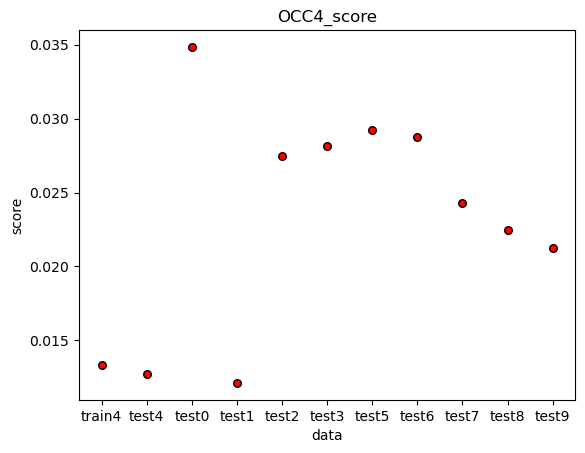

time: 250 ms (started: 2022-12-14 05:12:37 +09:00)


In [122]:
plt.xlabel("data")
plt.ylabel("score")
plt.title("OCC4_score") 
plt.scatter(x=["train4",'test4','test0','test1','test2','test3','test5','test6','test7','test8','test9'],y=score_stack,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC4/qsvdd/OCC_score.png')
plt.show()

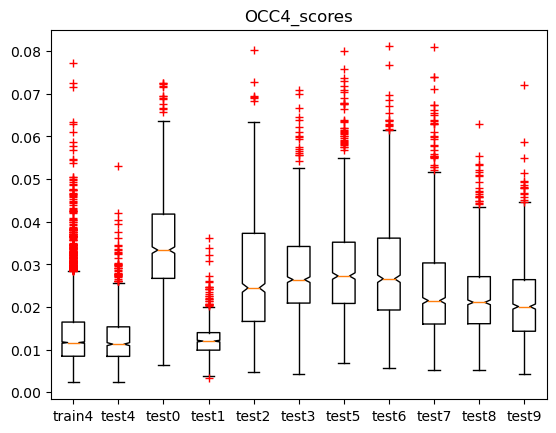

time: 344 ms (started: 2022-12-14 05:12:37 +09:00)


In [123]:
fig,ax = plt.subplots()
ax.boxplot([score_var_train,score_var_test0,score_var_test1,score_var_test2,score_var_test3,score_var_test4,score_var_test5,
score_var_test6,score_var_test7,score_var_test8,score_var_test9],notch=True,sym='r+')
plt.title('OCC4_scores')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11],["train4",'test4','test0','test1','test2','test3','test5','test6','test7','test8','test9'])
plt.savefig('./img/OCC4/qsvdd/OCC_scores.png')
plt.show()




### AUROC

In [124]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

time: 0 ns (started: 2022-12-14 05:12:38 +09:00)


In [125]:
def radius(data, center):
    res = []
    for j in range(len(data)):
        res.append(sum(abs(data - center)[j]**2))
    return res
        

time: 0 ns (started: 2022-12-14 05:12:38 +09:00)


In [126]:
radius_train0 = radius(data = predictions_exp0, center = center)
radius_test0 = radius(data = predictions_exp0_test, center = center)
radius_test1 = radius(data = predictions_exp1, center = center)
radius_test2 = radius(data = predictions_exp2, center = center)
radius_test3 = radius(data = predictions_exp3, center = center)
radius_test4 = radius(data = predictions_exp4, center = center)
radius_test5 = radius(data = predictions_exp5, center = center)
radius_test6 = radius(data = predictions_exp6, center = center)
radius_test7 = radius(data = predictions_exp7, center = center)
radius_test8 = radius(data = predictions_exp8, center = center)
radius_test9 = radius(data = predictions_exp9, center = center)

time: 4.36 s (started: 2022-12-14 05:12:38 +09:00)


In [127]:
y_pred0 = np.array(radius_test0)
y_true0 = np.zeros(len(radius_test0), dtype=int)
y_pred1 = np.array(radius_test1)
y_true1 = np.ones(len(radius_test1), dtype=int)
y_pred2 = np.array(radius_test2)
y_true2 = np.ones(len(radius_test2), dtype=int)
y_pred3 = np.array(radius_test3)
y_true3 = np.ones(len(radius_test3), dtype=int)
y_pred4 = np.array(radius_test4)
y_true4 = np.ones(len(radius_test4), dtype=int)
y_pred5 = np.array(radius_test5)
y_true5 = np.ones(len(radius_test5), dtype=int)
y_pred6 = np.array(radius_test6)
y_true6 = np.ones(len(radius_test6), dtype=int)
y_pred7 = np.array(radius_test7)
y_true7 = np.ones(len(radius_test7), dtype=int)
y_pred8 = np.array(radius_test8)
y_true8 = np.ones(len(radius_test8), dtype=int)
y_pred9 = np.array(radius_test9)
y_true9 = np.ones(len(radius_test9), dtype=int)

time: 0 ns (started: 2022-12-14 05:12:42 +09:00)


In [128]:
y_pred01 = np.concatenate((y_pred0,y_pred1),axis=None)
y_true01 = np.concatenate((y_true0,y_true1),axis=None)
y_pred02 = np.concatenate((y_pred0,y_pred2),axis=None)
y_true02 = np.concatenate((y_true0,y_true2),axis=None)
y_pred03 = np.concatenate((y_pred0,y_pred3),axis=None)
y_true03 = np.concatenate((y_true0,y_true3),axis=None)
y_pred04 = np.concatenate((y_pred0,y_pred4),axis=None)
y_true04 = np.concatenate((y_true0,y_true4),axis=None)
y_pred05 = np.concatenate((y_pred0,y_pred5),axis=None)
y_true05 = np.concatenate((y_true0,y_true5),axis=None)
y_pred06 = np.concatenate((y_pred0,y_pred6),axis=None)
y_true06 = np.concatenate((y_true0,y_true6),axis=None)
y_pred07 = np.concatenate((y_pred0,y_pred7),axis=None)
y_true07 = np.concatenate((y_true0,y_true7),axis=None)
y_pred08 = np.concatenate((y_pred0,y_pred8),axis=None)
y_true08 = np.concatenate((y_true0,y_true8),axis=None)
y_pred09 = np.concatenate((y_pred0,y_pred9),axis=None)
y_true09 = np.concatenate((y_true0,y_true9),axis=None)

time: 0 ns (started: 2022-12-14 05:12:42 +09:00)


In [129]:
# fpr, tpr, _ = roc_curve(y_true01, y_pred01)
# auc_measure = auc(fpr,tpr)
# auc_measure

time: 0 ns (started: 2022-12-14 05:12:42 +09:00)


In [130]:
fpr1, tpr1, _ = roc_curve(y_true01, y_pred01)
fpr2, tpr2, _ = roc_curve(y_true02, y_pred02)
fpr3, tpr3, _ = roc_curve(y_true03, y_pred03)
fpr4, tpr4, _ = roc_curve(y_true04, y_pred04)
fpr5, tpr5, _ = roc_curve(y_true05, y_pred05)
fpr6, tpr6, _ = roc_curve(y_true06, y_pred06)
fpr7, tpr7, _ = roc_curve(y_true07, y_pred07)
fpr8, tpr8, _ = roc_curve(y_true08, y_pred08)
fpr9, tpr9, _ = roc_curve(y_true09, y_pred09)

time: 0 ns (started: 2022-12-14 05:12:42 +09:00)


In [131]:
auc1 = roc_auc_score(y_true01,y_pred01)
auc2 = roc_auc_score(y_true02,y_pred02)
auc3 = roc_auc_score(y_true03,y_pred03)
auc4 = roc_auc_score(y_true04,y_pred04)
auc5 = roc_auc_score(y_true05,y_pred05)
auc6 = roc_auc_score(y_true06,y_pred06)
auc7 = roc_auc_score(y_true07,y_pred07)
auc8 = roc_auc_score(y_true08,y_pred08)
auc9 = roc_auc_score(y_true09,y_pred09)
auc = [auc1,auc2,auc3,auc4,auc5,auc6,auc7,auc8,auc9]

time: 16 ms (started: 2022-12-14 05:12:42 +09:00)


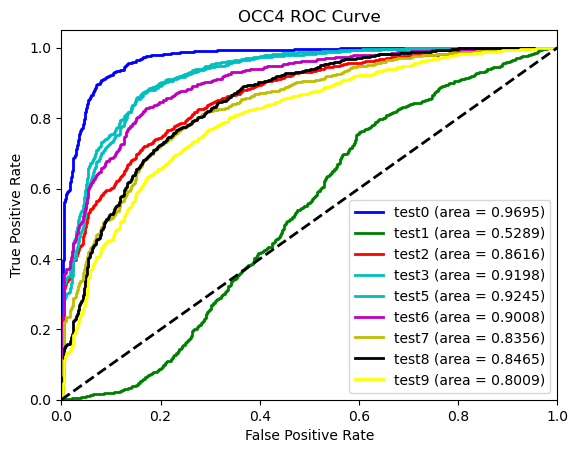

time: 344 ms (started: 2022-12-14 05:12:42 +09:00)


In [132]:
plt.figure()
lw = 2
plt.plot(fpr1,tpr1,color='b',lw=lw,label="test0 (area = %0.4f)" % auc1)
plt.plot(fpr2,tpr2,color="g",lw=lw,label="test1 (area = %0.4f)" % auc2)
plt.plot(fpr3,tpr3,color="r",lw=lw,label="test2 (area = %0.4f)" % auc3)
plt.plot(fpr4,tpr4,color="c",lw=lw,label="test3 (area = %0.4f)" % auc4)
plt.plot(fpr5,tpr5,color="c",lw=lw,label="test5 (area = %0.4f)" % auc5)
plt.plot(fpr6,tpr6,color="m",lw=lw,label="test6 (area = %0.4f)" % auc6)
plt.plot(fpr7,tpr7,color="y",lw=lw,label="test7 (area = %0.4f)" % auc7)
plt.plot(fpr8,tpr8,color="k",lw=lw,label="test8 (area = %0.4f)" % auc8)
plt.plot(fpr9,tpr9,color="yellow",lw=lw,label="test9 (area = %0.4f)" % auc9)







plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC4 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC4/qsvdd/OCC4_ROC.png')
plt.show()

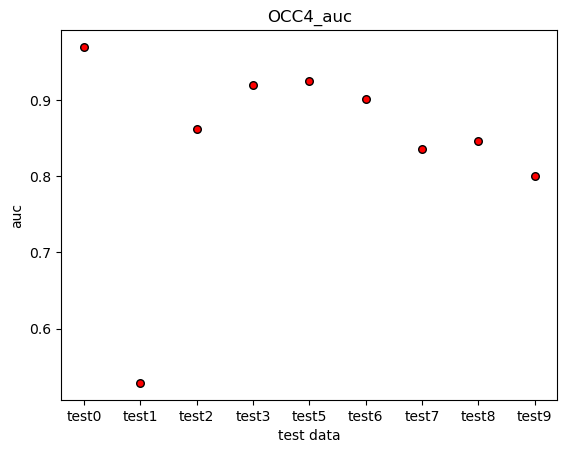

time: 203 ms (started: 2022-12-14 05:12:43 +09:00)


In [133]:
plt.xlabel("test data")
plt.ylabel("auc")
plt.title("OCC4_auc") 
plt.scatter(x=['test0','test1','test2','test3','test5','test6','test7','test8','test9'],y=auc,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC4/qsvdd/OCC4_auc.png')
plt.show()

In [134]:
print(auc)

[0.9695062138908517, 0.5289124954018141, 0.8616383665672019, 0.9198261781371619, 0.9245258651232854, 0.9007564129274753, 0.8355555643608295, 0.8464736927947407, 0.8008776409463505]
time: 0 ns (started: 2022-12-14 05:12:43 +09:00)


In [135]:
savetxt('./img/OCC4/qsvdd/auc_OCC4.txt',auc,delimiter=',', fmt='%0.6f')

time: 15 ms (started: 2022-12-14 05:12:43 +09:00)


In [136]:
y_pred_ano = np.concatenate((y_pred1,y_pred2,y_pred3,y_pred4,y_pred6,y_pred7,y_pred8,y_pred9), axis=None)
y_true_ano = np.concatenate((y_true1,y_true2,y_true3,y_true4,y_true6,y_true7,y_true8,y_true9), axis=None)
y_pred_all = np.concatenate((y_pred0,y_pred_ano),axis=None)
y_true_all = np.concatenate((y_true0,y_true_ano),axis=None)

time: 0 ns (started: 2022-12-14 05:12:43 +09:00)


In [137]:
fpr_all, tpr_all, _ = roc_curve(y_true_all, y_pred_all)
auc_all = roc_auc_score(y_true_all, y_pred_all)


time: 15 ms (started: 2022-12-14 05:12:43 +09:00)


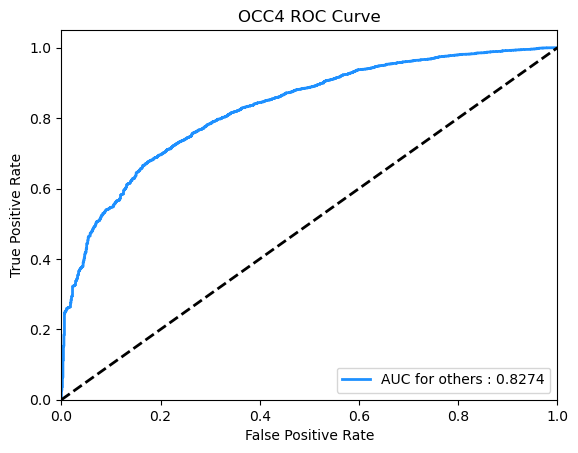

time: 235 ms (started: 2022-12-14 05:12:43 +09:00)


In [138]:
plt.figure()
lw = 2
plt.plot(fpr_all,tpr_all,color='dodgerblue',lw=lw,label="AUC for others : %0.4f" % auc_all)
plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC4 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC4/qsvdd/OCC4_ROC_all.png')
plt.show()

In [139]:
auc.append(auc_all)

time: 0 ns (started: 2022-12-14 05:12:43 +09:00)


In [140]:
auc

[0.9695062138908517,
 0.5289124954018141,
 0.8616383665672019,
 0.9198261781371619,
 0.9245258651232854,
 0.9007564129274753,
 0.8355555643608295,
 0.8464736927947407,
 0.8008776409463505,
 0.8273558560613313]

time: 0 ns (started: 2022-12-14 05:12:43 +09:00)


In [141]:
savetxt('./img/OCC4/qsvdd/auc_OCC4.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:12:43 +09:00)
